# Self-Driving Car Engineer Nanodegree

## Deep Learning

## Project: Build a Traffic Sign Recognition Classifier

In this notebook, a template is provided for you to implement your functionality in stages which is required to successfully complete this project. If additional code is required that cannot be included in the notebook, be sure that the Python code is successfully imported and included in your submission, if necessary. Sections that begin with **'Implementation'** in the header indicate where you should begin your implementation for your project. Note that some sections of implementation are optional, and will be marked with **'Optional'** in the header.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

---
## Step 0: Load The Data

In [86]:
import pickle
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
from random import randint
import cv2
%matplotlib inline

Two lines below disable scrolling of the output cell  

In [87]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

In [88]:
# Load pickled data
training_file = '../train.p'
testing_file = '../test.p'

with open(training_file, mode='rb') as f:
    train = pickle.load(f)
with open(testing_file, mode='rb') as f:
    test = pickle.load(f)
    
X_train, y_train = train['features'], train['labels']
X_test, y_test = test['features'], test['labels']

---

## Step 1: Dataset Summary & Exploration

The pickled data is a dictionary with 4 key/value pairs:

- `'features'` is a 4D array containing raw pixel data of the traffic sign images, (num examples, width, height, channels).
- `'labels'` is a 2D array containing the label/class id of the traffic sign. The file `signnames.csv` contains id -> name mappings for each id.
- `'sizes'` is a list containing tuples, (width, height) representing the the original width and height the image.
- `'coords'` is a list containing tuples, (x1, y1, x2, y2) representing coordinates of a bounding box around the sign in the image. **THESE COORDINATES ASSUME THE ORIGINAL IMAGE. THE PICKLED DATA CONTAINS RESIZED VERSIONS (32 by 32) OF THESE IMAGES**

Complete the basic data summary below.

In [89]:
### Replace each question mark with the appropriate value.
import numpy as np

# Number of training examples
n_train = len(X_train)

# Number of testing examples.
n_test = len(y_train)

# What's the shape of an traffic sign image?
image_shape = X_train.shape[1:3]

# How many unique classes/labels there are in the dataset.
n_classes = len(np.unique(y_train))

print("Number of training examples =", n_train)
print("Number of testing examples =", n_test)
print("Image data shape =", image_shape)
print("Number of classes =", n_classes)

Number of training examples = 39209
Number of testing examples = 39209
Image data shape = (32, 32)
Number of classes = 43


Visualize the German Traffic Signs Dataset using the pickled file(s). This is open ended, suggestions include: plotting traffic sign images, plotting the count of each sign, etc.

The [Matplotlib](http://matplotlib.org/) [examples](http://matplotlib.org/examples/index.html) and [gallery](http://matplotlib.org/gallery.html) pages are a great resource for doing visualizations in Python.

**NOTE:** It's recommended you start with something simple first. If you wish to do more, come back to it after you've completed the rest of the sections.

In [90]:
def signname(index):
    import pandas as pd
    signnames = pd.read_csv('signnames.csv')
    return signnames[signnames.ClassId == index].SignName.tolist()[0]

It's alsways a good idea to visualize a distribution of a dataset to get the fealing of the data. Below is the seaborn's histogram with the kernel density estimation for out better visual consumption.

(0, 42)

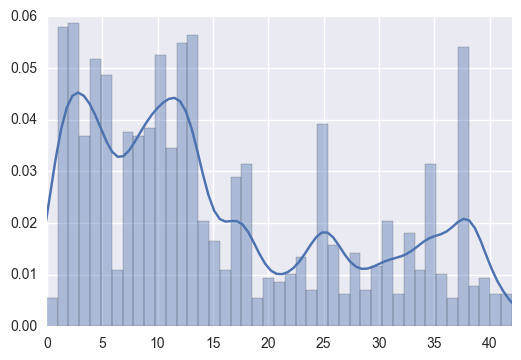

In [91]:
hist = sns.distplot(y_train, bins=43)
plt.xlim(0, 42)

Working on classification problems, we need to know how balanced the class values are.
According to the histogram above, we have more examples of some signs and less of anothers, which means that traffic signs are highly imbalanced. That can make our network think that appearance of more frequent traffic sign is more probable. To solve this problem I'm going to generate synthetic samples later in the data augmentation section.

I create a dictionary, which maps each sign class to the index of the signs in the training data. It's going to be helpful later during the traffic signs visualization and data augmentation.

In [92]:
def freq_dic(y):
    """
    Function creates dictionary of traffic signs class - index
    """
    signs_dic = {}
    for i, var in enumerate(y):
        if var not in signs_dic:
            signs_dic[var] = [i]
        else:
            signs_dic[var].append(i)
    
    return signs_dic

def show_signs(X,y):
    f = plt.figure(figsize=(20,40))
    signs_dic = freq_dic(y)
    for i in range(n_classes):
        ax = f.add_subplot(11, 4, i+1)
        index = signs_dic[i][randint(0, len(signs_dic[i]))]
        image = X[index].squeeze()
        plt.grid(False)
        plt.imshow(image, cmap="gray")
        ax.set_title(str(index)+': '+signname(y[index]))   

signs_dic = freq_dic(y_train)
# list of signs' frequencies
signs_freq_list  = np.bincount(y_train)

# maximum of single class frequencies
new_signs_count = max(signs_freq_list)
print ("The highest frequency of a single traffic sign in the training data: ", new_signs_count)

The highest frequency of a single traffic sign in the training data:  2250


Below I'm going to visualize random examples of each sign.

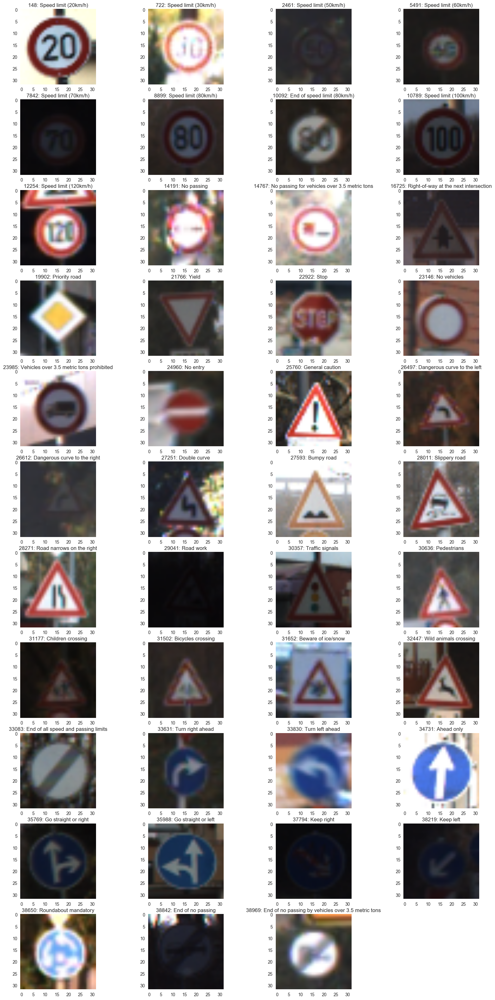

In [93]:
show_signs(X_train,y_train)

As long as the test data is available for me, I'm going to visualize it as well. I should be careful using this data (and not to fit the model with it on the training step of course). But visualizing it as well can help me grab the right ideas for the visual transformations.

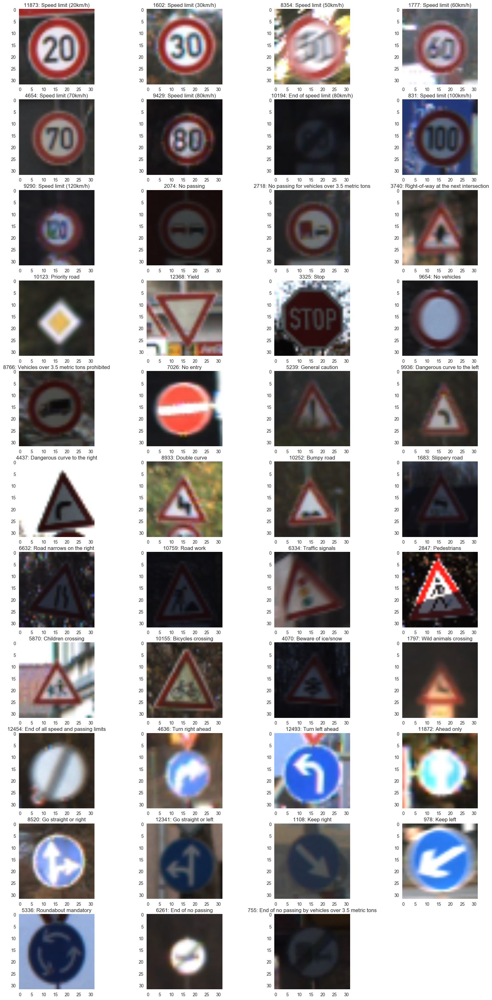

In [94]:
show_signs(X_test, y_test)

Looking at the images with traffic signs, I mention a couple of things:
*  Signs have bad resolution. First I've considered low resolution as a limiting factor, but later I realized that in order to focus the network on the sign meaning I should give less information about low level pixels.
*  Size of the signs varies visually from 50% to 90% of image size.  
*  Signs are not strictly vertical and horizontal but might be rotated on a small degree left or right in 3D.  
*  Some images are really dark and some really light so I even can't say what's on them. I should find an appropriate color transformation in order to make the images more informative.
*  Some of the signs are just partly visible (covered by other signs or objects).
*  Signs mostly located in the center of the image with possible shift up to 5-10% each direction.

----

## Step 2: Design and Test a Model Architecture

Design and implement a deep learning model that learns to recognize traffic signs. Train and test your model on the [German Traffic Sign Dataset](http://benchmark.ini.rub.de/?section=gtsrb&subsection=dataset).

There are various aspects to consider when thinking about this problem:

- Neural network architecture
- Play around preprocessing techniques (normalization, rgb to grayscale, etc)
- Number of examples per label (some have more than others).
- Generate fake data.

Here is an example of a [published baseline model on this problem](http://yann.lecun.com/exdb/publis/pdf/sermanet-ijcnn-11.pdf). It's not required to be familiar with the approach used in the paper but, it's good practice to try to read papers like these.

**NOTE:** The LeNet-5 implementation shown in the [classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/601ae704-1035-4287-8b11-e2c2716217ad/concepts/d4aca031-508f-4e0b-b493-e7b706120f81) at the end of the CNN lesson is a solid starting point. You'll have to change the number of classes and possibly the preprocessing, but aside from that it's plug and play!

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

### Question 1 

_Describe how you preprocessed the data. Why did you choose that technique?_

**Answer:**

In order to make any machine learning successful, data should be cleaned, balanced and preprocessed - ready for the further application of the math.  

On the initial phase my idea was that the size of the training data should be increased in order to balance the dataset (provide almost the same number of examples in each class), images should be preprocessed to make life of the neural network easier and performance better.  



### Data Augmentation

If you generated additional data, how did you generate the data? Why did you generate the data? What are the differences in the new dataset (with generated data) from the original dataset?

As was mentioned above, balancing training dataset is important for classification models.
In order to handle this task, I've written the function for data augmentation (generating additional images artificially). Just copying the existing images doesn't sound like a good for me because it migh add aditional bias and overfitting to the model (If I fit the model with the same images of the sign during the training and for test take picture of the same sign but from a little bit different angle/rotated/etc., the model will not be probably able to recognize it). So during the data augmentation I should apply some geometric or color transformations to the images.
  
Here is the list of transormations I've tried to apply randomly to each generated image:
*  Translation - shifting of the image in (x,y) direction on the random value from -4 to 4 pixels.
*  Rotation - rotation of the image on a random angle from -15 to 15 degrees from the vertical.
*  Affine Transformation - image transformation which preserves points, straight lines and planes. Sets of parallel lines remain parallel after an affine transformation.
*  Perspective Transformation which is just zooming in.

There are also other techniques, which might be used for data augmentation but weren't tried here:
*  horizontally flipping;
*  color jittering;
*  changing saturation and value (S and V components of the HSV color space) of all pixels to a power between 0.25 and 4 (same for all pixels within a patch), multiply these values by a factor between 0.7 and 1.4, and add to them a value between -0.1 and 0.1
*  adding a value between [-0.1, 0.1] to the hue (H component of HSV) of all pixels in the image/patch;
etc.[1]

Despite all transformations make sence for me, I've finished just with rotation on the random angle from -15 to 15 degress from the vertical. All other transformations droped the performance of the model crucially. The reason of such behaviour might be in characteristics of the given dataset: most of signs have the same size, same angle from which picture was taken and central location on the image. For the real world application of the model, it would be beneficial to add such transformations as shifting (location of the sign on the image) or affine transformation (angle of view). Shortcoming here is that the amount of the generated data should be significant. But advantage is clear: model will perform good on the new images taken by people on the streets.

To balance the dataset I've generated the new images so that the amount of each class is equal to the maximum frequency of the single class in the given dataset.  

In [95]:
def shifting(img):
    """
    """
    rows,cols = img.shape[:2]
    shift_x = randint(0,8) - 4
    shift_y = randint(0,8) - 4
    M = np.float32([[1,0,shift_x],[0,1,shift_y]])
    return cv2.warpAffine(img,M,(cols,rows))

def rotation(img):
    """
    """
    rows,cols = img.shape[:2]
    M = cv2.getRotationMatrix2D((cols/2,rows/2),randint(0,30)-15,1)
    #M = cv2.getRotationMatrix2D((cols/2,rows/2),randint(0,90)+45,1)
    #M = cv2.getRotationMatrix2D((cols/2,rows/2),randint(45,360-45),1)
    return cv2.warpAffine(img,M,(cols,rows))

def affine(img):
    """
    """
    rows,cols = img.shape[:2]
    if randint(0,1):
        pts1 = np.float32([[50,50],[200,50],[50,200]])*32/400
        pts2 = np.float32([[10,100],[200,50],[100,250]])*32/400
    else:
        pts1 = np.float32([[50,50],[200,50],[50,200]])*32/400
        pts2 = np.float32([[60,0],[200,50],[0,150]])*32/400    
    M = cv2.getAffineTransform(pts1,pts2)
    return cv2.warpAffine(img,M,(cols,rows))

def perspective(img):
    """
    """
    rows,cols = img.shape[:2]
    scale = randint(0,4)
    pts1 = np.float32([[scale,scale],[32-scale,scale],[scale,32-scale],[32-scale,32-scale]])
    pts2 = np.float32([[0,0],[32,0],[0,32],[32,32]])
    M = cv2.getPerspectiveTransform(pts1,pts2)
    return cv2.warpPerspective(img,M,(32,32))

def geom_transf(img):
    """
    """
#    choice = randint(0,3)
    choice = 2
    if choice == 0:
        return shifting(img)
    elif choice == 1:
        return perspective(img)
    elif choice == 2:
        return rotation(img)
    elif choice == 3:
        return affine(img)
#    return affine(rotation(perspective(shifting(img))))

In [96]:
# Data augmentation
# Here I set the size of generated dataset.
num = 1
sum_freq = sum(signs_freq_list)
max_freq = max(signs_freq_list)
new_signs_count = num * max_freq
size_au = max_freq * n_classes - sum_freq + (num - 1) * max_freq * n_classes

X_train_au = np.empty([size_au,32,32,3], dtype='uint8')
y_train_au = np.empty([size_au], dtype='uint8')

ind=0
for i in range(n_classes):
    for j in range(new_signs_count - signs_freq_list[i]):
        index_ = randint(0, len(signs_dic[i])-1)
        index = signs_dic[i][index_]        
        X_train_au[ind] = geom_transf(X_train[index])
        y_train_au[ind] = i
        ind += 1
print (X_train_au.shape[0],"images were successfully generated")

57541 images were successfully generated


I would like to make a short mark here that generating large array of even small size images (32x32 here) might be tricky if we don't plan the size of the array at the beginning, but extending it (using append function) on each iteration of the image generation.  
In general, changing the size of the allocated for the array memory is very expensive operation. My first attempts to generate the same 57k of images took hours when I've appended new image to the array every time.

In [97]:
X_train = np.concatenate((X_train, X_train_au),axis=0)
y_train = np.concatenate((y_train, y_train_au),axis=0)
print ("Given dataset was concatenated with the just generated dataset")
print ("Size of the new training data set is",X_train.shape[0], "images")

Given dataset was concatenated with the just generated dataset
Size of the new training data set is 96750 images


Visualizing the data distribution in our training dataset again and expect uniform distribtion.

(0, 42)

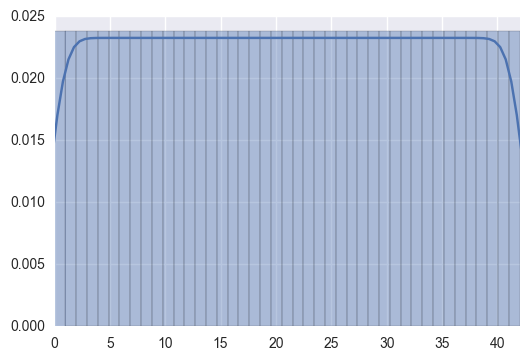

In [98]:
hist = sns.distplot(y_train, bins=43)
plt.xlim(0, 42)

### Data preprocessing

In [99]:
### Preprocess the data here.

def grayscale(img):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

def clahe_transform (img):
    """
    Funtion takes an image as input and return a new image with
    applied adaptive histogram equalization
    """
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl1 = clahe.apply(img)
    return cl1

def gray_arr(arr):
    arr_gray = np.empty([len(arr),32,32,1], dtype='uint8')
    for i in range(len(arr)):
        arr_gray[i] = np.reshape(grayscale(arr[i]), (32,32,1))
    return arr_gray

def equ_arr(arr):
    equ_arr = np.zeros_like(arr)
    for i in range(len(arr)):
        equ_arr[i] = np.reshape(cv2.equalizeHist(arr[i]), (32,32,1))
    return equ_arr

def clahe_arr(arr):
    clahe_arr = np.zeros_like(arr)
    for i in range(len(arr)):
        clahe_arr[i] = np.reshape(clahe_transform(arr[i]), (32,32,1))
    return clahe_arr

def norm_arr(arr):
    return (arr - 128)/128

def show():
    """
    Function visualize a traffic sign and all grayscale transformations
    """
    img = cv2.cvtColor(X_train[0], cv2.COLOR_BGR2GRAY)
    equ = cv2.equalizeHist(img)
    clh = clahe_transform(img)
    equ_clh = clahe_transform(equ)
    clh_equ = cv2.equalizeHist(clh)
    names = ['Original','Grayscale','Equalization','CHLOE','EQU->CHLOE','CHLOE->EQU']
    plt.figure(figsize=(32,32))
    for i, var in enumerate([X_train[0],img,equ,clh,equ_clh,clh_equ]):
        ax=plt.subplot(161 + i)
        plt.grid(False)
        plt.imshow(var)
        ax.set_title(names[i],fontsize=30)

        plt.setp(ax.get_xticklabels(), visible=False)
        plt.setp(ax.get_yticklabels(), visible=False)
        
def data_pp(X, gray=0, norm=0):
    """
    Data preprocessing function. Takes an array of images, grayscale 
    and normalization flags as input and performs data transformation
    """
    X_pp = np.empty([len(X),32,32,1])
    # transform input to Gray
    if (gray==1):
        X_pp = np.empty([len(X),32,32,1])
        for i in range(len(X)):
            X_pp[i] = np.reshape(grayscale(X[i]), (32,32,1))
    else:
        X_pp = np.copy(X)
    #normalize input (X - 128)/128
    if (norm==1):
        X_pp = norm_arr(X_pp)
    return X_pp


On the data preprocessing step I'm applying visual transformation to the images as well as zero-centralization and normalization.  
Visualization of the given traffic signs makes me think that colors and different light conditions will confuse the network more than provide meaningful information. Quick comparison (on the later steps) of using RGB vs. grayscale images on the model showed significantly better performance of the second.

#### Grayscale
First, I wanted to transform images into gray scale because the color doesn't add a lot of sence here. And as the images have often such deffects as sun light - colors are unjustified load on the network.  

I should point out here, that to make more comprehensive traffic sign classifier with the model, able to identify the meaning of unseen signs (the round sign with red circle always permit something should make classifier be worried), It makes senct to try applying color filters in order to transform all shades of the color to it's master shade. But it stays out of the scope of the project.   

#### Histogram equalization
Part of the images are quite dark and I wanted to apply the histogram equalization to improve the contrast of the images. I've tried histogram equalization and adaptive histogram equalization (CLAHE - Contrast Limited Adaptive Histogram Equalization) methods from the OpenCV library.

#### Canny 
Another approach is to use Canny Edge Detector to make the information on the image more meaningful.

Below you could see the traffic sing and all transformations

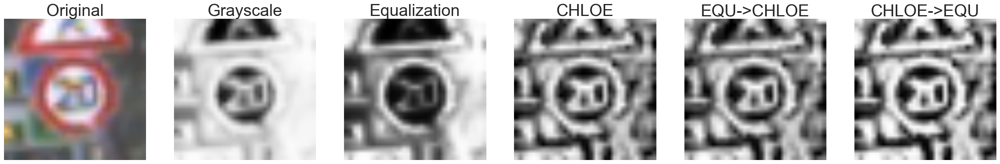

In [100]:
show()

I've tried all color transformations (including combination of histogram equalization methods) options and found out that just transforming the image into grayscale gives the best result.
The reason might be additional noice which brings each transformation to the image.


#### Data Centration and Normalization
Final step of the data preprocessing is zero-centralization of the input pixels and normalization (transforming pixel value from range [0,255] to range [-128/128,127/128].  
With the non normalized data, on the neural network training step, the optimizer should make a lot of searching to find a good solution, when the centered and normalized data makes it a lot easier for optimizer to make it's job.

In [101]:
X_train_pp = data_pp(X_train, gray=1, norm=1)
X_test_pp = data_pp(X_test, gray=1, norm=1)
assert X_train_pp.shape[0] == X_train.shape[0]
assert X_test_pp.shape[0] == X_test.shape[0]
print ("Data preprocessed successfully")

Data preprocessed successfully


### Question 2

_Describe how you set up the training, validation and testing data for your model. **Optional**: If you generated additional data, how did you generate the data? Why did you generate the data? What are the differences in the new dataset (with generated data) from the original dataset?_

### Training - Validation - Testing sets

In the machine learning it's a common practice to split dataset in training and testing. There are a number of reasons for this.  
*  If we test the performance of the model on the same data as was used during the training, results will just represent the ability of the model to memorize. To get an estimate of the model's performance we need a new unseen dataset
*  The good model should be able not just memorize the training data but be able to generalize: make a good prediction on an unseen before data. The situation when model performs good on a testing set and bad on a training set calls overfitting. Having the different testing set serves as a check on overfitting (or failure to generalize).
  
During the tuning of the model's parameteres in order to improve the performance, testing set slowly leak to the model and can't serve as an independent dataset to estimate the performance anymore. That's why splitting the training dataset into 2 sets - training and validation - let us validate the model on the independent dataset and keep the testing set behind the catle.   
  
In the classical machine learning cross validation technique is usually used to effectively split data into training and validation and improve the accuracy estimation. Keeping in mind that neural networks are "resoure-hungry", this technique is not popular here and I'm going to use just a train-test-split method from scikit-learn library.  

I'm going to split in proportion 95-5 to give the model as much data for training as possible.

In [102]:
# splitting train data into train and validate sets with ratio 95:5
from sklearn.model_selection import train_test_split
X_train_pp, X_validation, y_train, y_validation = train_test_split(
    X_train_pp, y_train, test_size=0.05, random_state=42)

In [103]:
print('In absolute value, there are', X_train_pp.shape[0],'images in training set,',\
     X_validation.shape[0],'- in validation set,',X_test.shape[0],' - in testing set.')

In absolute value, there are 91912 images in training set, 4838 - in validation set, 12630  - in testing set.


### Question 3

_What does your final architecture look like? (Type of model, layers, sizes, connectivity, etc.)  For reference on how to build a deep neural network using TensorFlow, see [Deep Neural Network in TensorFlow
](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/b516a270-8600-4f93-a0a3-20dfeabe5da6/concepts/83a3a2a2-a9bd-4b7b-95b0-eb924ab14432) from the classroom._


In this project I'm using LeNet architecture made by Yan LeCun in 1998 with average pooling after each convolutional layer, additional fully connected layer to manage more output classes and droupout nodes after first three fully connected layers for controlling the overfitting. Here is the specification of the network:  
0. The input is images 32x32x1
1.  Convolution layer 1. The output shape should be 28x28x6.
2.  Activation 1. ReLU function
3.  Pooling layer 1. The output shape is 14x14x6.
3.  Convolution layer 2. The output shape is 10x10x16.
1.  Activation 2. ReLU function
1.  Pooling layer 2. The output shape is 5x5x16.
1.  Flatten layer. 
1.  Fully connected layer 1. Has 250 outputs.
1.  Activation (ReLU function)
1.  Dropout
1.  Fully connected layer 2. Has 120 outputs.
1.  Activation (ReLU function)
1.  Dropout
1.  Fully connected layer 2. Has 84 outputs.
1.  Activation (ReLU function)
1.  Fully connected layer 3. Has 43 outputs.

For my neural network I've chosen to use convolutional layers which are especially effective for the problem of object classification on the image. Applying tiny neural networks with shared parameters on small parts of image, convolutional networks learns to recognize basic lines and curves, then shapes and blobs, and then increasingly complex objects within the image. Finally, the CNN classifies the image by combining the larger, more complex objects.

ReLU - the activation function of my choice in this project - is the simplest function which brings the non-linearity into the network and simplicity is what I need here. ReLUs makes the training speedy because of simple gradient computation, which prevents the problem of "vanishing gradient." The vanishing gradient problem occurs in sigmoid units, where the gradient essentially becomes 0 after a certain amount of training (because of the horizontalasymptotes) and stops all learning in that section of the network.

There are advanced versions of ReLU popular nowadays which are staying out of the scope of this project.

In [104]:
#LeNet
import tensorflow as tf
from sklearn.utils import shuffle

EPOCHS = 10
BATCH_SIZE = 128
input_channels = len(X_train_pp[0][0][0])

from tensorflow.contrib.layers import flatten

mu = 0
sigma = 0.1
    
weights = {
    'layer_1': tf.Variable(tf.truncated_normal(
        [5, 5, input_channels, 6])),
    'layer_2': tf.Variable(tf.truncated_normal(
        [5, 5, 6, 16])),
    'fully_connected1': tf.Variable(tf.truncated_normal(
            shape=(400, 250), mean = mu, stddev = sigma)),
    'fully_connected12': tf.Variable(tf.truncated_normal(
            shape=(250, 120), mean = mu, stddev = sigma)),
    'fully_connected2': tf.Variable(tf.truncated_normal(
            shape=(120, 84), mean = mu, stddev = sigma)),
    'fully_connected3': tf.Variable(tf.truncated_normal(
            shape=(84, 43), mean = mu, stddev = sigma))
}
biases = {
    'layer_1': tf.Variable(tf.zeros(6)),
    'layer_2': tf.Variable(tf.zeros(16)),
    'fully_connected1': tf.Variable(tf.zeros(250)),
    'fully_connected12': tf.Variable(tf.zeros(120)),
    'fully_connected2': tf.Variable(tf.zeros(84)),

    'fully_connected3': tf.Variable(tf.zeros(43))
}
def LeNet(x):    
    # Hyperparameters
    
    padding = 'VALID'
    # TODO: Layer 1: Convolutional. Input = 32x32xinput_channels. Output = 28x28x6.
    conv1 = tf.nn.conv2d(x, weights['layer_1'], strides=[1,1,1,1], padding='VALID') + biases['layer_1']

    # TODO: Activation.
    conv1 = tf.nn.relu(conv1)

    # TODO: Pooling. Input = 28x28x6. Output = 14x14x6.
    conv1 = tf.nn.avg_pool(conv1, ksize=[1,2,2,1], strides=[1,2,2,1], padding='VALID')
    
    # TODO: Layer 2: Convolutional. Output = 10x10x16.
    conv2 = tf.nn.conv2d(conv1, weights['layer_2'], strides=[1,1,1,1], padding='VALID') + biases['layer_2']
    
    # TODO: Activation.
    conv2 = tf.nn.relu(conv2)

    # TODO: Pooling. Input = 10x10x16. Output = 5x5x16.
    conv2 = tf.nn.avg_pool(conv2, ksize=[1,2,2,1], strides=[1,2,2,1], padding='VALID')

    # TODO: Flatten. Input = 5x5x16. Output = 400.
    flatten = tf.contrib.layers.flatten(conv2)

    # TODO: Layer 3: Fully Connected. Input = 400. Output = 120.
    fc3 = tf.add(tf.matmul(flatten, weights['fully_connected1']),biases['fully_connected1'] )
    
    # TODO: Activation.
    fc3 = tf.nn.relu(fc3)
     # Dropout
    
    fc3_drop = tf.nn.dropout(fc3, keep_prob)

    
    # TODO: Layer 3: Fully Connected. Input = 400. Output = 120.
    fc30 = tf.add(tf.matmul(fc3_drop, weights['fully_connected12']),biases['fully_connected12'] )
    
    # TODO: Activation.
    fc30 = tf.nn.relu(fc30)
    
    # Dropout
    
    fc30_drop = tf.nn.dropout(fc30, keep_prob)

    # TODO: Layer 4: Fully Connected. Input = 120. Output = 84.
    fc4 = tf.add(tf.matmul(fc30_drop, weights['fully_connected2']), biases['fully_connected2'])
    
    # TODO: Activation.
    fc4 = tf.nn.relu(fc4)

    # Dropout
    
    fc4_drop = tf.nn.dropout(fc4, keep_prob)
    
    # TODO: Layer 5: Fully Connected. Input = 84. Output = 43.
    fc5 = tf.add(tf.matmul(fc4_drop, weights['fully_connected3']), biases['fully_connected3'])
    logits = fc5
    
    return logits

#Features and labels
x = tf.placeholder(tf.float32, (None, 32, 32, input_channels))
y = tf.placeholder(tf.int32, (None))
keep_prob = tf.placeholder(tf.float32)
one_hot_y = tf.one_hot(y, 43)

# Training Pipeline
rate = 0.001

logits = LeNet(x)
cross_entropy = tf.nn.softmax_cross_entropy_with_logits(logits, one_hot_y)
loss_operation = tf.reduce_mean(cross_entropy)
optimizer = tf.train.AdamOptimizer(learning_rate = rate)
training_operation = optimizer.minimize(loss_operation)

# Model Evaluation
correct_prediction = tf.equal(tf.argmax(logits, 1), tf.argmax(one_hot_y, 1))
accuracy_operation = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))
saver = tf.train.Saver()

def evaluate(X_data, y_data):
    num_examples = len(X_data)
    total_accuracy = 0
    sess = tf.get_default_session()
    for offset in range(0, num_examples, BATCH_SIZE):
        batch_x, batch_y = X_data[offset:offset+BATCH_SIZE], y_data[offset:offset+BATCH_SIZE]
        accuracy = sess.run(accuracy_operation, feed_dict={x: batch_x, y: batch_y, keep_prob: 1})
        total_accuracy += (accuracy * len(batch_x))
    return total_accuracy / num_examples

In [105]:
### Train your model here.
### Feel free to use as many code cells as needed.
# Train the Model
with tf.Session() as sess:
    sess.run(tf.initialize_all_variables())
    num_examples = len(X_train_pp)
    
    print("Training...")
    print()
    for i in range(EPOCHS):
        X_train_pp, y_train = shuffle(X_train_pp, y_train)
        for offset in range(0, num_examples, BATCH_SIZE):
            end = offset + BATCH_SIZE
            batch_x, batch_y = X_train_pp[offset:end], y_train[offset:end]
            sess.run(training_operation, feed_dict={x: batch_x, y: batch_y, keep_prob: 0.7})
            
        validation_accuracy = evaluate(X_validation, y_validation)
        print("EPOCH {} ...".format(i+1))
        print("Validation Accuracy = {:.3f}".format(validation_accuracy))
        print()
        
    saver.save(sess, 'lenet')
    print("Model saved")

Training...

EPOCH 1 ...
Validation Accuracy = 0.764

EPOCH 2 ...
Validation Accuracy = 0.912

EPOCH 3 ...
Validation Accuracy = 0.949

EPOCH 4 ...
Validation Accuracy = 0.964

EPOCH 5 ...
Validation Accuracy = 0.974

EPOCH 6 ...
Validation Accuracy = 0.979

EPOCH 7 ...
Validation Accuracy = 0.982

EPOCH 8 ...
Validation Accuracy = 0.984

EPOCH 9 ...
Validation Accuracy = 0.984

EPOCH 10 ...
Validation Accuracy = 0.986

Model saved


In [106]:
print ("Accuracy on test data")
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('.'))

    test_accuracy = evaluate(X_test_pp, y_test)
    print("Test Accuracy = {:.3f}".format(test_accuracy))

Accuracy on test data
Test Accuracy = 0.914


### Question 4

_How did you train your model? (Type of optimizer, batch size, epochs, hyperparameters, etc.)_


**Answer:**
In order to train and validate my model, I've done the following steps:
1.  Created the TensorFlow session and initiated all variables and trained the model over EPOCHs.  
2.  At the beginning of each EPOCH I've shuffled the training data to ensure that our training is not biased by the order of the images in the training data set.  
3.  Then I've broken the training data set into batches and train the model on each batch.  
4.  At the end of each EPOCH I've validated the model on the validation data.
5.  Once the model is completely trained, it's saved.

Parameters:  
2.  Optimizer: Adam algorithm to minimize the loss function. 
3.  Batch size is 128.  
3.  EPOCHs is 10.  
1.  Learning rate is 0.001 (how quickly to update the network's weights).  


### Question 5


_What approach did you take in coming up with a solution to this problem? It may have been a process of trial and error, in which case, outline the steps you took to get to the final solution and why you chose those steps. Perhaps your solution involved an already well known implementation or architecture. In this case, discuss why you think this is suitable for the current problem._

**Answer:**
Current solution is a starting point and default choice.
I've started from LeNet architecture as it proves the efficiency over the years and I had an experience with it on the MNiST data set. The model shows appropriate accuracy and might be a starting point for further experiments.  
As a follow up steps I'm considering trying over well known implementations such as:
1.  AlexNet developed by Alex Krizhevsky, Ilya Sutskever and Geoff Hinton.  
2.  ZF Net by Matthew Zeiler and Rob Fergus.  
3.  GoogLeNet by Szegedy et al from Google.  
3.  VGGNet by Karen Simonyan and Andrew Zisserman.  
4.  ResNet (Residual Network) developed by Kaiming He et al. [3]

---

## Step 3: Test a Model on New Images

Take several pictures of traffic signs that you find on the web or around you (at least five), and run them through your classifier on your computer to produce example results. The classifier might not recognize some local signs but it could prove interesting nonetheless.

You may find `signnames.csv` useful as it contains mappings from the class id (integer) to the actual sign name.

### Question 6

_Choose five candidate images of traffic signs and provide them in the report. Are there any particular qualities of the image(s) that might make classification difficult? It could be helpful to plot the images in the notebook._



**Answer:**  
To test the model I've tried 2 datasets:
1.  First was gathered by Hanqiu Ying on the streets of Germany. All the signs were in the training data. The quality of the signs is comparable to the given data. However all the signs have same big size (while, as mentioned, about traffic signs in the given dataset have variable size, mostly smaller) and there is a higher variability of the angle of view in this test set. I guess these two points (size, angle of view) might make the performance of the model lower but not dramatically.
2.  Second was just a collection of sign icons found in the internet. The signs looks visually different, have different size (very large, not always fit into the image). I guess the performance of the model will be bad.

Test Accuracy = 0.828


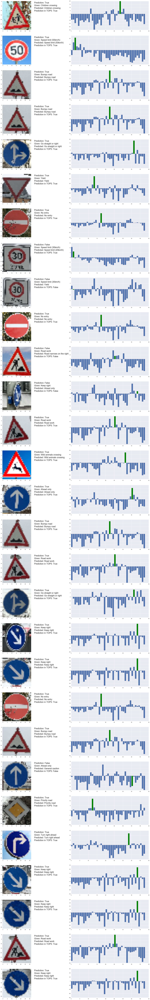

In [113]:
import matplotlib
matplotlib.rcParams.update({'font.size': 22})

new_signs = 'traffic-signs-data/new_signs.p'

with open(new_signs, mode='rb') as f:
    test_my = pickle.load(f)
    
X_test_my = test_my['data']
y_test_my = np.array([28,2,22,22,36,
                            13,17,1,1,17,
                            25,38,25,31,35,
                            22,25,36,38,38,
                            17,22,35,12,33,
                            38,38,25,38
                           ],dtype=np.uint8)
    
X_test_my_pp = data_pp(X_test_my, gray=1, norm=1)
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('.'))
    test_accuracy = evaluate(X_test_my_pp, y_test_my)
    logits_ds = sess.run(logits, feed_dict={x: X_test_my_pp, keep_prob:1})
    
b = plt.figure(figsize=(32,32/5*29))

for i, image in enumerate(X_test_my):
    
    ax = b.add_subplot(len(X_test_my), 2, 2*i+1)
    plt.grid(False)
    plt.imshow(X_test_my[i])

    predict = (y_test_my[i] == np.argmax(logits_ds[i]))
    text = "Prediction: " + str(predict)
    ax.text(35, 2, text)
    text = "Given: " + signname(y_test_my[i])
    ax.text(35, 5, text)
    text = "Predicted: " + signname(np.argmax(logits_ds[i]))
    ax.text(35, 8, text)
    top5 = logits_ds[i][y_test_my[i]] in np.sort(logits_ds[i])[:37:-1]    
    text = "Prediction in TOP5: " + str(top5)
    ax.text(35, 11, text)

    ax = b.add_subplot(len(X_test_my), 2, 2*i+2)
    bi = plt.bar(range(43), logits_ds[i])
    bi[y_test_my[i]].set_color('g')
    
print("Test Accuracy = {:.3f}".format(test_accuracy))

Test Accuracy = 0.400


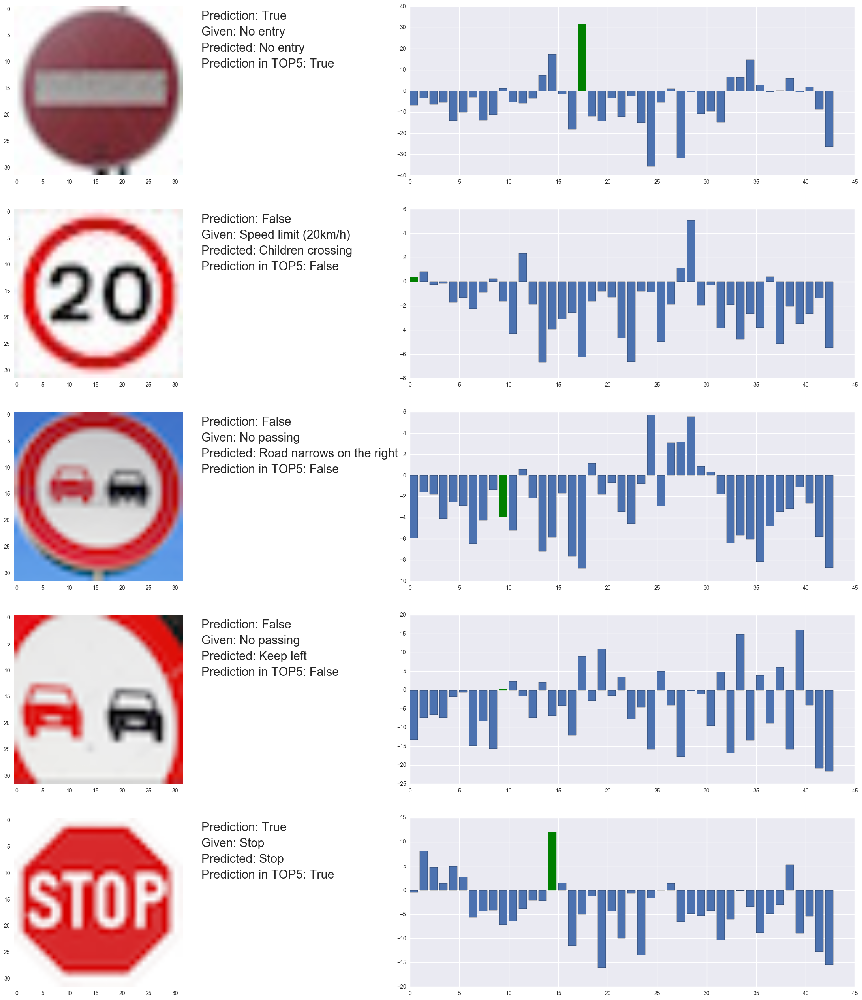

In [114]:
import os
import cv2

X_test_my = np.empty([5,32,32,3],dtype=np.uint8)
y_test_my = np.array([17, 0, 9, 9, 14])

test_images = os.listdir("traffic-signs-data/my_signs/")
if '.DS_Store' in test_images:
    test_images.remove('.DS_Store')

for i, name in enumerate(test_images):
    X_test_my[i] = cv2.cvtColor(cv2.imread('traffic-signs-data/my_signs/'+name), cv2.COLOR_BGR2RGB)

X_test_my_pp = data_pp(X_test_my, gray=1, norm=1)

with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('.'))

    test_accuracy = evaluate(X_test_my_pp, y_test_my)
    logits_ds = sess.run(logits, feed_dict={x: X_test_my_pp, keep_prob:1})
    
b = plt.figure(figsize=(32,32))

for i, image in enumerate(X_test_my):
    
    ax = b.add_subplot(5, 2, 2*i+1)
    plt.grid(False)
    plt.imshow(X_test_my[i])

    predict = (y_test_my[i] == np.argmax(logits_ds[i]))
    text = "Prediction: " + str(predict)
    ax.text(35, 2, text)
    text = "Given: " + signname(y_test_my[i])
    ax.text(35, 5, text)
    text = "Predicted: " + signname(np.argmax(logits_ds[i]))
    ax.text(35, 8, text)
    top5 = logits_ds[i][y_test_my[i]] in np.sort(logits_ds[i])[:37:-1]    
    text = "Prediction in TOP5: " + str(top5)
    ax.text(35, 11, text)
    ax = b.add_subplot(5, 2, 2*i+2)
    bi = plt.bar(range(43), logits_ds[i])
    bi[y_test_my[i]].set_color('g')
    
print("Test Accuracy = {:.3f}".format(test_accuracy))

### Question 7

_Is your model able to perform equally well on captured pictures when compared to testing on the dataset? The simplest way to do this check the accuracy of the predictions. For example, if the model predicted 1 out of 5 signs correctly, it's 20% accurate._

_**NOTE:** You could check the accuracy manually by using `signnames.csv` (same directory). This file has a mapping from the class id (0-42) to the corresponding sign name. So, you could take the class id the model outputs, lookup the name in `signnames.csv` and see if it matches the sign from the image._


**Answer:**  
As expected, first set showed comparable accuracy with the given data set - 0.828 (0.914 - model accuracy on the given test data). Model struggled with the large and turned images which were completely unrepresented in the training dataset.  

2 of 5 traffic signs were predicted correctly (accuracy 0.4 comparing to 0.914 on a given test data). The result prooves that the model's performance is poor on the completely different signs. My hope is also on data augmentation.
Further work on the data augmentation should improve the predictions on a real life traffic signs.

### Question 8

*Use the model's softmax probabilities to visualize the **certainty** of its predictions, [`tf.nn.top_k`](https://www.tensorflow.org/versions/r0.12/api_docs/python/nn.html#top_k) could prove helpful here. Which predictions is the model certain of? Uncertain? If the model was incorrect in its initial prediction, does the correct prediction appear in the top k? (k should be 5 at most)*

`tf.nn.top_k` will return the values and indices (class ids) of the top k predictions. So if k=3, for each sign, it'll return the 3 largest probabilities (out of a possible 43) and the correspoding class ids.

Take this numpy array as an example:

```
# (5, 6) array
a = np.array([[ 0.24879643,  0.07032244,  0.12641572,  0.34763842,  0.07893497,
         0.12789202],
       [ 0.28086119,  0.27569815,  0.08594638,  0.0178669 ,  0.18063401,
         0.15899337],
       [ 0.26076848,  0.23664738,  0.08020603,  0.07001922,  0.1134371 ,
         0.23892179],
       [ 0.11943333,  0.29198961,  0.02605103,  0.26234032,  0.1351348 ,
         0.16505091],
       [ 0.09561176,  0.34396535,  0.0643941 ,  0.16240774,  0.24206137,
         0.09155967]])
```

Running it through `sess.run(tf.nn.top_k(tf.constant(a), k=3))` produces:

```
TopKV2(values=array([[ 0.34763842,  0.24879643,  0.12789202],
       [ 0.28086119,  0.27569815,  0.18063401],
       [ 0.26076848,  0.23892179,  0.23664738],
       [ 0.29198961,  0.26234032,  0.16505091],
       [ 0.34396535,  0.24206137,  0.16240774]]), indices=array([[3, 0, 5],
       [0, 1, 4],
       [0, 5, 1],
       [1, 3, 5],
       [1, 4, 3]], dtype=int32))
```

Looking just at the first row we get `[ 0.34763842,  0.24879643,  0.12789202]`, you can confirm these are the 3 largest probabilities in `a`. You'll also notice `[3, 0, 5]` are the corresponding indices.

**Answer:**
I've added the feature "Prediction in TOP5" in the logits visualization section. In most of the cases if the prediction was incorrect, the correct class was also not among TOP5 predictions.  
On the first dataset (real photos of germans' traffic signs) model made most of mistakes with blue signs. During the data preprocessing I've transformed images into grayscale which was probably not the most optimal solution as I've lost information about the color.  
On the second dataset model was wrong on the signs which are zoomed in more than others. Data augmentation via rotation, shearing and translation should improve the current result.

> **Note**: Once you have completed all of the code implementations and successfully answered each question above, you may finalize your work by exporting the iPython Notebook as an HTML document. You can do this by using the menu above and navigating to  \n",
    "**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.

### Resources
1.  Xiu-Shen Wei, Nanjing University. Must Know Tips for Deep Learning Neural Networks, Part 1.   http://www.kdnuggets.com/2016/03/must-know-tips-deep-learning-part-1.html  
1.  German sign classification using deep learning neural networks. Vivek Yadav. https://chatbotslife.com/german-sign-classification-using-deep-learning-neural-networks-98-8-solution-d05656bf51ad#.g7vfjpcoy
3. CS231n Convolutional Neural Networks for Visual Recognition  
http://cs231n.github.io/convolutional-networks/#case
4.  Histogram Equalization   
http://docs.opencv.org/trunk/d5/daf/tutorial_py_histogram_equalization.html
4.  Geometric Transformations of Images  
http://docs.opencv.org/3.0-beta/doc/py_tutorials/py_imgproc/py_geometric_transformations/py_geometric_transformations.html